# Filtering

Filtering images is at the core of image processing. The idea is to use a small image that travels across a larger image and does some operation on each sub-region of this larger image. In the simplest case, we can imagine that a small square travels across the image and computes the *local mean* of the pixels with which it overlaps. This is then a mean filter which blurs sharp edges:

In [1]:
from IPython.display import HTML, display
HTML(filename='../illustrations/convol_mean.html')

Multiple properties of the *little travelling square* can change:
- the pixel values of the square can be anything. For example it's common to have a 2D gaussian for smoothing the image (see below)
- the size and shape of the square can change
- the operation done by the square does not have to be a simple multiplication-addition (convolution). It can also be another function like a median for example.

Filters can be applied to regular images, as well as to masks (binary images) and are often used to clean-up an image or to detect object. scikit-image implements most of these filters in ```skimage.filters``` and ```skimage.morphology``` and we are going to look at a few.

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from microfilm.microplot import microshow
import skimage
import skimage.io
import skimage.morphology

## Linear filters

### Blurring effect

Linear filters work by convoluting an image with a smaller template. That small template can be anything, but commonly it is a well-defined small matrix. For example it can be a 2D Gaussian. We can have a look at its actual shape by filtering an image that has a single pixel ON:

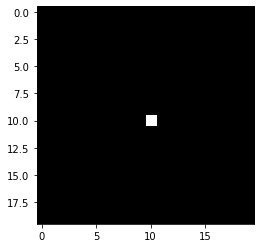

In [3]:
single_dot = np.zeros((20,20))
single_dot[10,10] = 1
plt.imshow(single_dot, cmap = 'gray');

The Gaussian has default values and we can simply apply it on an image:

In [4]:
filtered = skimage.filters.gaussian(single_dot)

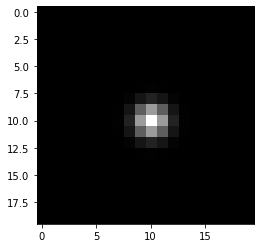

In [5]:
plt.imshow(filtered, cmap = 'gray');

We can just plot a cross section to better understand what happened:

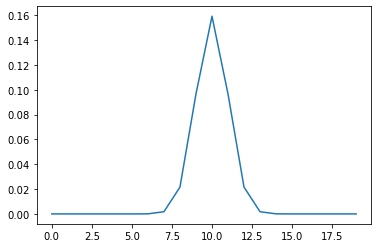

In [6]:
plt.plot(filtered[10,:]);

The effect of this filtering was to "widen" the original single pixel, which is now spread out across the image. We can now also specify the width of the gaussian:

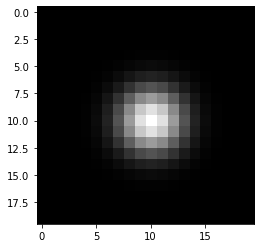

In [7]:
filtered = skimage.filters.gaussian(single_dot,sigma=2)
plt.imshow(filtered, cmap = 'gray');

The Gaussian has become even wider. Let's put two dots on our image and see what happens:

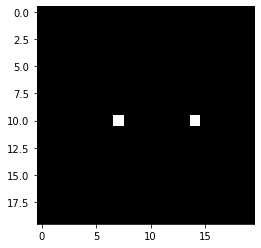

In [8]:
double_dot = np.zeros((20,20))
double_dot[10,7] = 1
double_dot[10,14] = 1
plt.imshow(double_dot, cmap = 'gray');

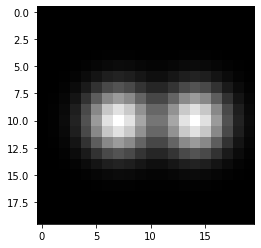

In [9]:
filtered = skimage.filters.gaussian(double_dot,sigma=2)
plt.imshow(filtered, cmap = 'gray');

The end effect is to blur our image. If we apply our filter twice we get an even blurrier image:

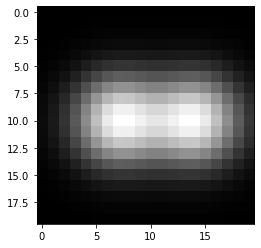

In [10]:
filtered2 = skimage.filters.gaussian(filtered,sigma=2)
plt.imshow(filtered2, cmap = 'gray');

### Removing noise

Gaussian filtering does not only blur information, it also helps removing noise. Let's for example take again our blurred image and add some noise to it. For that we use the numpy random module:

In [11]:
noisy = filtered + 0.02 * np.random.rand(20,20)

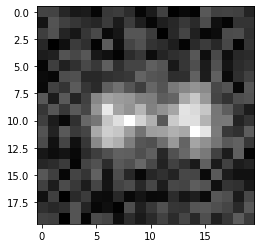

In [12]:
plt.imshow(noisy, cmap = 'gray');

If we now apply again our gaussian filter:

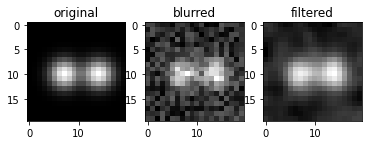

In [13]:
noise_filtered = skimage.filters.gaussian(noisy, sigma=1)

fig, ax = plt.subplots(1,3)
ax[0].imshow(filtered, cmap = 'gray');
ax[1].imshow(noisy, cmap = 'gray');
ax[2].imshow(noise_filtered, cmap = 'gray');
ax[0].set_title('original')
ax[1].set_title('blurred')
ax[2].set_title('filtered');

We obtain an image which of course is blurred, but where the strong noise has mostly disappeared.

### Filtering an image

We have been toying here with singe pixel images, but of course the goal is to apply such a filter to an actual image. Let's import one and adjust the width of our gaussian to see it's effect on a real image:

In [14]:
image_stack = skimage.io.imread('../data/cellaltlas/images/46658_784_B12_1.tif')
image_nuclei = image_stack[1250:1750,300:800,2]

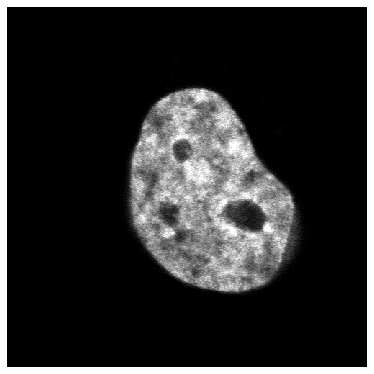

In [15]:
microshow(image_nuclei, fig_scaling=5);

In [16]:
filtered_image = skimage.filters.gaussian(image_nuclei)

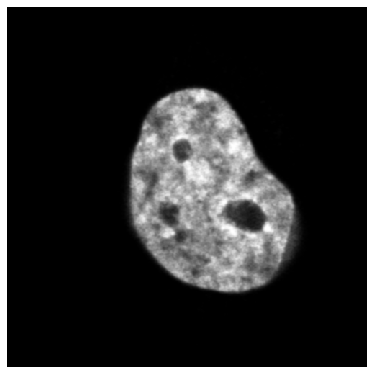

In [17]:
microshow(filtered_image, fig_scaling=5);

In [18]:
filtered_image = skimage.filters.gaussian(image_nuclei, sigma = 5)

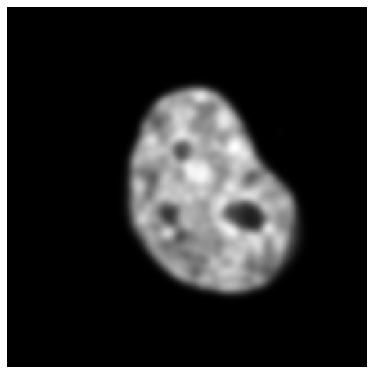

In [19]:
microshow(filtered_image, fig_scaling=5);

How can this help for our workflow? Let's compare thresholding performed on the original image and the filtered one above:

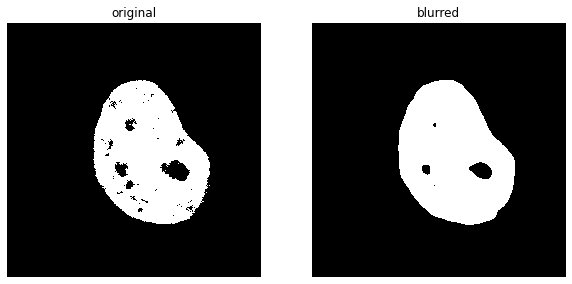

In [20]:
mask = image_nuclei > skimage.filters.threshold_otsu(image_nuclei)
mask_blurred = filtered_image > skimage.filters.threshold_otsu(filtered_image)

fig, ax = plt.subplots(1,2, figsize=(10,10))
microshow(mask, ax=ax[0]);
microshow(mask_blurred, ax=ax[1]);
ax[0].set_title('original')
ax[1].set_title('blurred');

Clearly, as blurring removes extreme values, the thresholding produces a "cleaner" mask in the filtered image than the original image.

Image filtering is of course a **vast** topic, and you should read more about it if you need it in your work. This example just illustrates how to use filters in Python using scikit-image.

## Non-linear filters

Another class of filters does not use convolution to filter the image but does some other type of operation on small neighborhoods of the image. For example it can calculate the median value of each 3x3 sub-region in the image. This is extremely useful if our image has pixels that are "dead" or have extremely large values.

For purpose of illustration, we can artificially create such an image using a skimage utility:

In [21]:
image_noisy = skimage.util.random_noise(image_nuclei, mode='s&p')

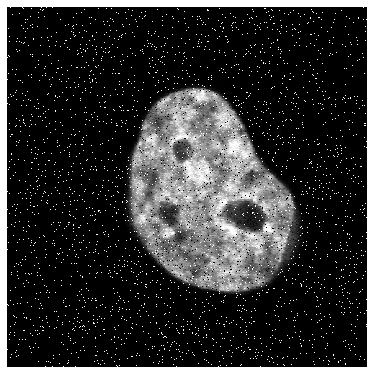

In [22]:
microshow(image_noisy, fig_scaling=5);

If we apply a median filter of size 3x3, pixels which are completely out of range are going to be replaced by the median value of their surroundings. The others, will be mildly affected:

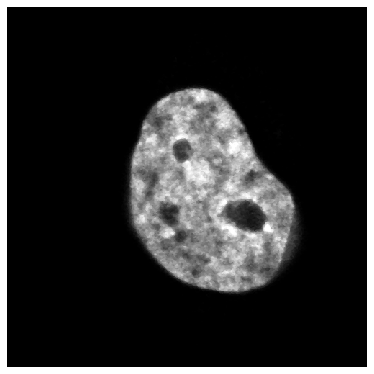

In [23]:
filtered_median = skimage.filters.median(image_noisy)

microshow(filtered_median, fig_scaling=5);

This is a complete success!

### Other selection elements

Until now we have relied on the default regions considered for filtering. For example the median filter operates by default on a 3x3 square regions. However, we can specify any other shape or *footprint*. For example we can use a Numpy array:

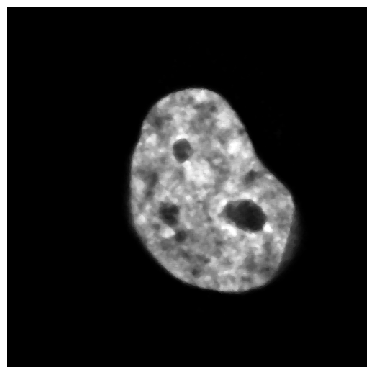

In [24]:
footprint = np.ones((5,5))
filtered_median = skimage.filters.median(image_noisy, footprint=footprint)
microshow(filtered_median, fig_scaling=5);

Or we can use pre-made shapes that are available directly in scikit-image. For example a disk with a certain radius. This is actually what is done in the Demo notebook for the filtering step:

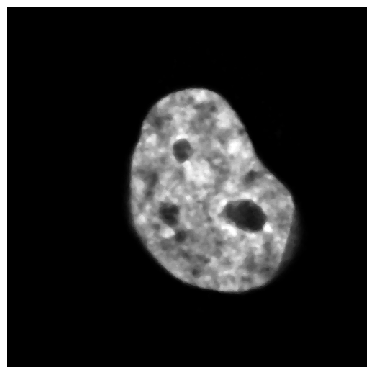

In [25]:
footprint = skimage.morphology.disk(3)
filtered_median = skimage.filters.median(image_noisy, footprint=footprint)
microshow(filtered_median, fig_scaling=5);

## Exercise

1. Import the ```HeLa_single.tif``` file
2. Filter the image with the ```sobel``` filter. Do you unerstand what it does?
3. Try to use the maximum filter (in ```skimage.filters.rank```). Choose different footprints and visualize the output